# Advanced Lane Finding Project

The goal of the project to develop image processing pipeline to be able to identify lane lines under various lighting condition, apply thresholding and masking, fit second-order polynomial and measure the curvature of the road.

The high-level overview of the project:
1. [Camera calibration and distortion correction](#camera_calibration)
2. [Processing road images](#image_pipeline_start)
  1. [Colorspace and Sobel thresholding](#thresholding)
  2. [Perspective transform](#perspective_transform)
  3. [Detecting lane lines and fitting polynomials](#poly_fit)
  4. [Measuring Curvature and vehicle offset](#curvature)
  5. [Putting all the steps together](#image_pipeline)
  6. [Visualizing results of image pipeline](#image_result)
3. [Object oriented design](#oop)
4. [Video processing pipeline](#video_pipeline)

## <a id='camera_calibration'> 1. Camera calibration and distortion correction</a>

### 1.1 Find chessboard corners

First, we use OpenCV to `findChessboardCorners` and identify corresponding `objpoints` (ideal coordinates of a chessboard plane in a 3D space, e.g. `[2., 0., 0.]`, `z`-coordinate always `0`) and `imgpoints` (real 2D-pixel coordinates of chessboard corners on a photo, e.g. `[265.0, 631.7]`). We then use  `calibrateCamera` to find camera matrix and distortion coefficients.

In [1]:
import os
import re
import sys
import cv2
import glob
import numpy as np
import datetime
import argparse
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import math

# Visualizations will be shown in the notebook.
%matplotlib inline

After having done our imports, we read image names using `glob` API and prepare ideal coordinates of `nx` by `ny` chessboard:

In [2]:
#calibration images
images_cal = glob.glob("camera_cal/calibration*")
#size of the chessboard
nx = 9
ny = 6
#analytically find chessboard coordinates: from [0,0,0] to [nx,ny,0]
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
# Lists to store object points and image points from all calibration images.
objpoints = [] # 3d analytical points in real world space
imgpoints = [] # 2d real points in image plane.

For convenience, we define *natural* sorting, opposite to lexographical sorting, see sorting order below:

In [3]:
#natural sorting: sort calibration images with natural keys, not lexographically
def atoi(text):
    return int(text) if text.isdigit() else text

def natural_keys(text):
    '''
    alist.sort(key=natural_keys) sorts in human order
    http://nedbatchelder.com/blog/200712/human_sorting.html
    '''
    return [ atoi(c) for c in re.split('(\d+)', text) ]

images_cal.sort(key=natural_keys)

for img_fname in images_cal:
    print(img_fname)

camera_cal/calibration1.jpg
camera_cal/calibration2.jpg
camera_cal/calibration3.jpg
camera_cal/calibration4.jpg
camera_cal/calibration5.jpg
camera_cal/calibration6.jpg
camera_cal/calibration7.jpg
camera_cal/calibration8.jpg
camera_cal/calibration9.jpg
camera_cal/calibration10.jpg
camera_cal/calibration11.jpg
camera_cal/calibration12.jpg
camera_cal/calibration13.jpg
camera_cal/calibration14.jpg
camera_cal/calibration15.jpg
camera_cal/calibration16.jpg
camera_cal/calibration17.jpg
camera_cal/calibration18.jpg
camera_cal/calibration19.jpg
camera_cal/calibration20.jpg


We now visualize the original chessboard images:

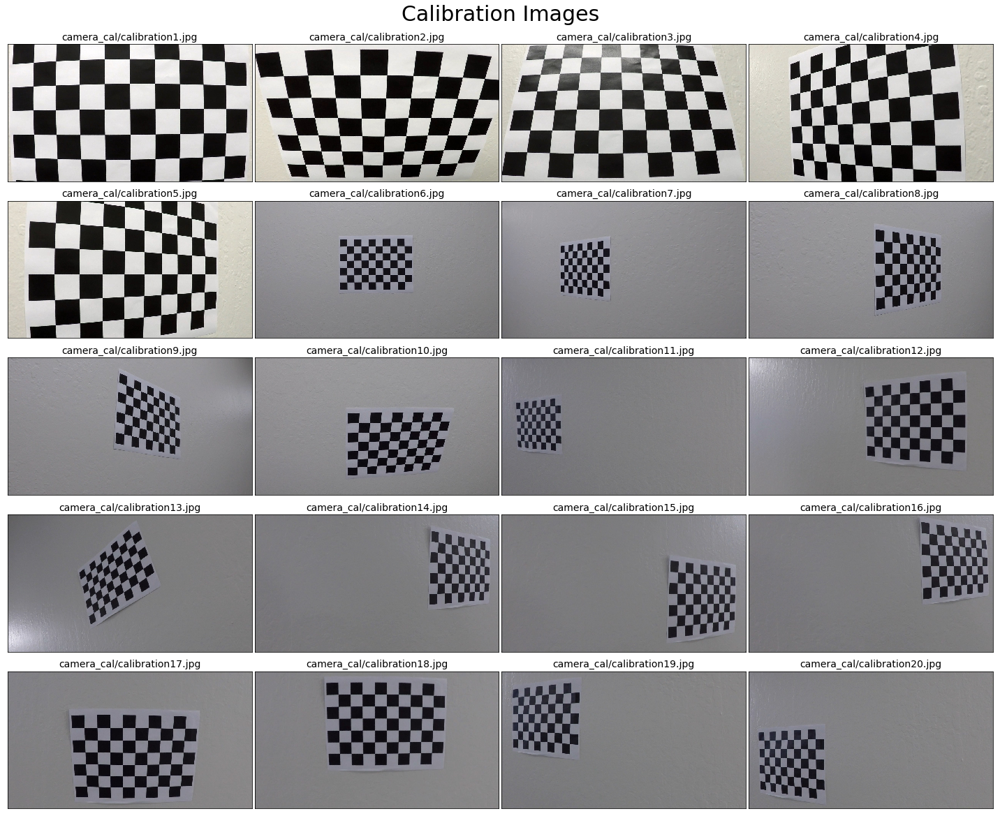

In [4]:
NUM_COLUMNS = 4
NUM_CAL_IMG = len(images_cal)
NUM_ROWS = math.ceil(NUM_CAL_IMG / NUM_COLUMNS)
fig = plt.figure(figsize=(20,16))
for idx, fname in enumerate(images_cal):
    img = mpimg.imread(fname)
    ax = fig.add_subplot(NUM_ROWS,NUM_COLUMNS,idx+1)
    ax.imshow(img, interpolation='none')
    ax.set_title(fname,  fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout(w_pad=-0.3, h_pad=-0.4)
plt.suptitle('Calibration Images', y=1.02, fontsize=30)
plt.show()

As can be seen in the textual output and the picture below, chessboard corners are found not in every image. If not found, we display a black square.

Chessboard found for camera_cal/calibration2.jpg
Chessboard found for camera_cal/calibration3.jpg
Chessboard found for camera_cal/calibration6.jpg
Chessboard found for camera_cal/calibration7.jpg
Chessboard found for camera_cal/calibration8.jpg
Chessboard found for camera_cal/calibration9.jpg
Chessboard found for camera_cal/calibration10.jpg
Chessboard found for camera_cal/calibration11.jpg
Chessboard found for camera_cal/calibration12.jpg
Chessboard found for camera_cal/calibration13.jpg
Chessboard found for camera_cal/calibration14.jpg
Chessboard found for camera_cal/calibration15.jpg
Chessboard found for camera_cal/calibration16.jpg
Chessboard found for camera_cal/calibration17.jpg
Chessboard found for camera_cal/calibration18.jpg
Chessboard found for camera_cal/calibration19.jpg
Chessboard found for camera_cal/calibration20.jpg


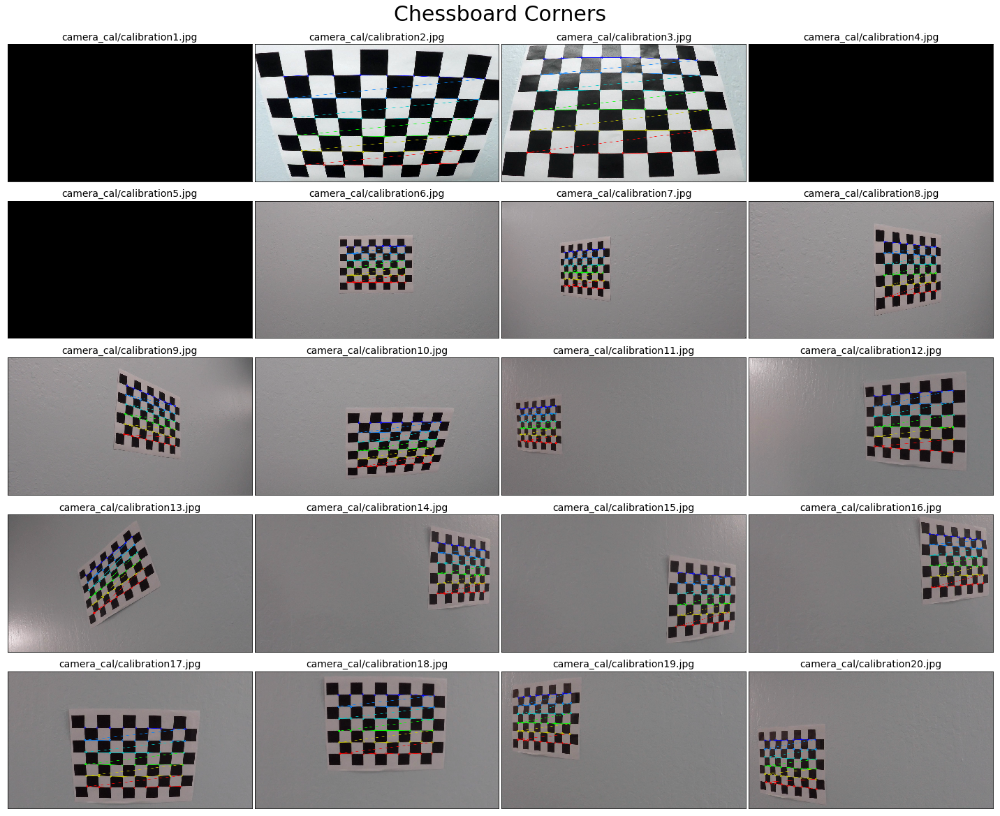

In [5]:
#finding & displaying chessboard corners
NUM_COLUMNS = 4
NUM_CAL_IMG = len(images_cal)
NUM_ROWS = math.ceil(NUM_CAL_IMG / NUM_COLUMNS)
fig = plt.figure(figsize=(20,16))

for idx, fname in enumerate(images_cal):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    ax = fig.add_subplot(NUM_ROWS,NUM_COLUMNS,idx+1)
    ax.set_title(fname,  fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
    # If found, add object points, image points
    if ret == True:
        print("Chessboard found for {}".format(fname))
        objpoints.append(objp)
        imgpoints.append(corners)
        #Draw the chessboard corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        ax.imshow(img, interpolation='none')
    else:
        ax.imshow(np.zeros_like(img))
plt.tight_layout(w_pad=-0.3, h_pad=-0.4)
plt.suptitle('Chessboard Corners', y=1.02, fontsize=30)
plt.show()

### 1.2 Undistort calibration images

We now find camera matrix and distortion coefficients and undistort camera calibration images.

In [6]:
img = mpimg.imread(images_cal[0])
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

if ret:
    print("Camera was calibrated successfully!")
else:
    print("Camera calibration failed!")

Camera was calibrated successfully!


Visualize undistorted calibration images:

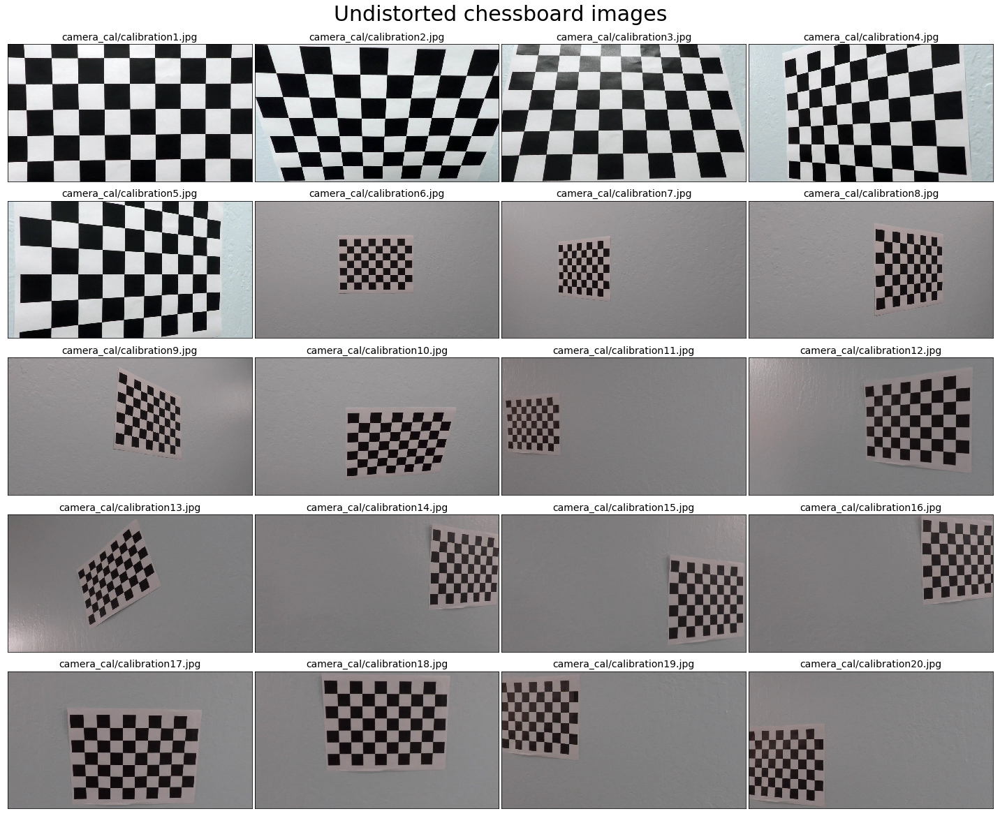

In [7]:
#displaying undistorted chessboard images
NUM_COLUMNS = 4
NUM_CAL_IMG = len(images_cal)
NUM_ROWS = math.ceil(NUM_CAL_IMG / NUM_COLUMNS)
fig = plt.figure(figsize=(20,16))

for idx, fname in enumerate(images_cal):
    img = cv2.imread(fname)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    ax = fig.add_subplot(NUM_ROWS,NUM_COLUMNS,idx+1)
    ax.set_title(fname,  fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
    # If found, add object points, image points
    ax.imshow(dst, interpolation='none')
plt.tight_layout(w_pad=-0.3, h_pad=-0.4)
plt.suptitle('Undistorted chessboard images', y=1.02, fontsize=30)
plt.show()

### 1.3 Save  camera matrix and distortion coefficients

We now save the camera matrix and distortion coefficients to the pickle file (for the future, we also save rotation `rvecs` and translation `tvecs` vectors).

In [8]:
camera_pickle = {}
camera_pickle["mtx"] = mtx
camera_pickle["dist"] = dist
camera_pickle["rvecs"] = rvecs
camera_pickle["tvecs"] = tvecs
with open("camera_pickle.p", "wb") as p:
    pickle.dump( camera_pickle, p )

Camera class is responsible for holding camera matrix and distortion coefficients and undistorting images from a camera.

In [9]:
class Camera:
    
    def __init__(self, pickle_file = 'camera_pickle.p'):
        self.pickle = pickle_file
        with(open(self.pickle, 'rb')) as p:
            camera_pickle = pickle.load(p)
            self.mtx = camera_pickle["mtx"]
            self.dist = camera_pickle["dist"]
    
    def undistort(self, img):
        return cv2.undistort(img, self.mtx, self.dist, None, self.mtx)

In [10]:
camera = Camera()

## <a id='image_pipeline_start'>2. Processing road images</a>

In this section we will incrementally build the image processing pipeline. We start from applying variants of Sobel operator (in `x` and `y` direction, magnitude (L2-norm), and direction (`arctan(y/x)`). We then transform an image to the *HLS* colorspace and apply the thresholds there. We then combine Sobel and color masks to get our binary mask. In the next step we use perspective transform to obtain "bird's-eye-view" of the road.

In [11]:
images_road = glob.glob("test_images/*")
images_road.sort(key=natural_keys)
for img in images_road:
    print(img)

test_images/straight_lines1.jpg
test_images/straight_lines2.jpg
test_images/test1.jpg
test_images/test2.jpg
test_images/test3.jpg
test_images/test4.jpg
test_images/test5.jpg
test_images/test6.jpg


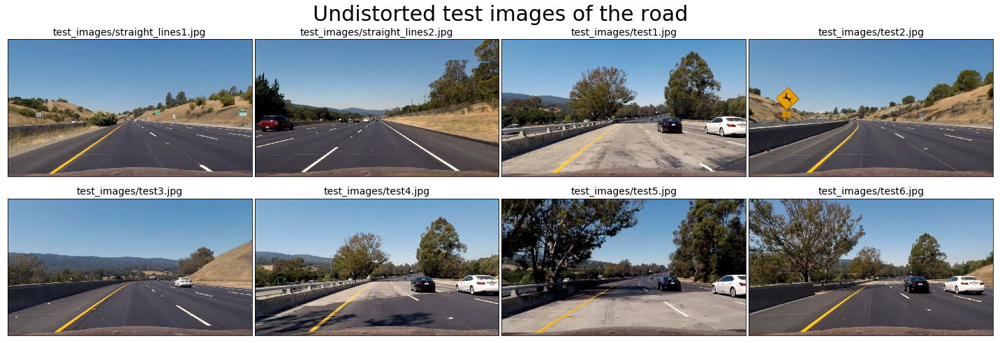

In [12]:
NUM_COLUMNS = 4
NUM_ROAD_IMG = len(images_road)
NUM_ROWS = math.ceil(NUM_ROAD_IMG / NUM_COLUMNS)
fig = plt.figure(figsize=(20,7))
for idx, fname in enumerate(images_road):
    img = mpimg.imread(fname)
    dst = camera.undistort(img)
    ax = fig.add_subplot(NUM_ROWS,NUM_COLUMNS,idx+1)
    ax.imshow(dst, interpolation='none')
    ax.set_title(fname,  fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout(w_pad=-0.3, h_pad=-1.0)
plt.suptitle('Undistorted test images of the road', y=1.02, fontsize=30)
plt.show()

###  <a id='thresholding'>2.1. Colorspace and Sobel thresholding</a>
Given various colors of the lane lines, various lightning condition, we apply Sobel and colorspace transform and thresholding to identify lane lines on different roads.
We first compute (i) absolute value of Sobel filter in `x` and `y` direction; (ii) gradient magnitude of the Sobel filter (l2-norm); (iii) directional threshold where we take `arctan` `y` / `x` for directional Sobel filters. We then combine all these thresholds in `threshold_image` method. We also use HLS colorspace and find a color threshold in `hls_threshold`. Color thresholds and Sobel thresholds are combined in the `apply_thresholds` method, which takes an undistorted image and returnes a thresholded binary image.

In [13]:
def abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient: x or y 
    # Apply threshold
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return grad_binary

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    # Calculate gradient magnitude (l2-norm)
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return mag_binary

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction -- arctan(y/x)
    # Apply threshold
    # 1) Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad_dir = np.arctan2(abs_sobel_y, abs_sobel_x)
    # 5) Create a binary mask where direction thresholds are met
    dir_binary = np.zeros_like(grad_dir)
    # 6) Return this mask as your binary_output image
    dir_binary[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    return dir_binary

def threshold_image(image, x_kernel=3, x_thresh=(30, 110), y_kernel=3, y_thresh=(40,110),
                           m_kernel=3, m_thresh=(30, 80),  d_kernel=7, d_thresh=(0.8,1.3)):
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=x_kernel, thresh=x_thresh)
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=y_kernel, thresh=y_thresh)
    mag_binary = mag_thresh(image, sobel_kernel=m_kernel, mag_thresh=m_thresh)
    dir_binary = dir_threshold(image, sobel_kernel=d_kernel, thresh=d_thresh)
    
    combined = np.zeros_like(dir_binary)
    #combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    combined[((gradx == 1)) | ((mag_binary == 1)) & (dir_binary == 1)] = 1

    return combined

def hls_threshold(img, s_thresh=(130, 255), l_thresh=(90,255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    return s_binary, l_binary

def apply_thresholds(img):
    s_binary, l_binary = hls_threshold(img)
    out_img = threshold_image(img)
    combined_binary = np.zeros_like(out_img)
    combined_binary[ (l_binary == 1) & (s_binary == 1) | (out_img == 1)] = 1
    return combined_binary

def get_color_binary(img):
    s_binary, l_binary = hls_threshold(img)
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.uint8(np.dstack(( np.zeros_like(s_binary), l_binary, s_binary)) * 255)
    return color_binary

Current version of the image pipeline looks as follows: (i) undistort an image; (ii) apply thresholding

In [14]:
def image_pipiline_V_0_1(img):
    undist = camera.undistort(img)
    binary_thresh = apply_thresholds(undist)
    return binary_thresh

Let's visualize results of thresholding: Sobel thresholding, colorspace thresholding, combined thresholding:

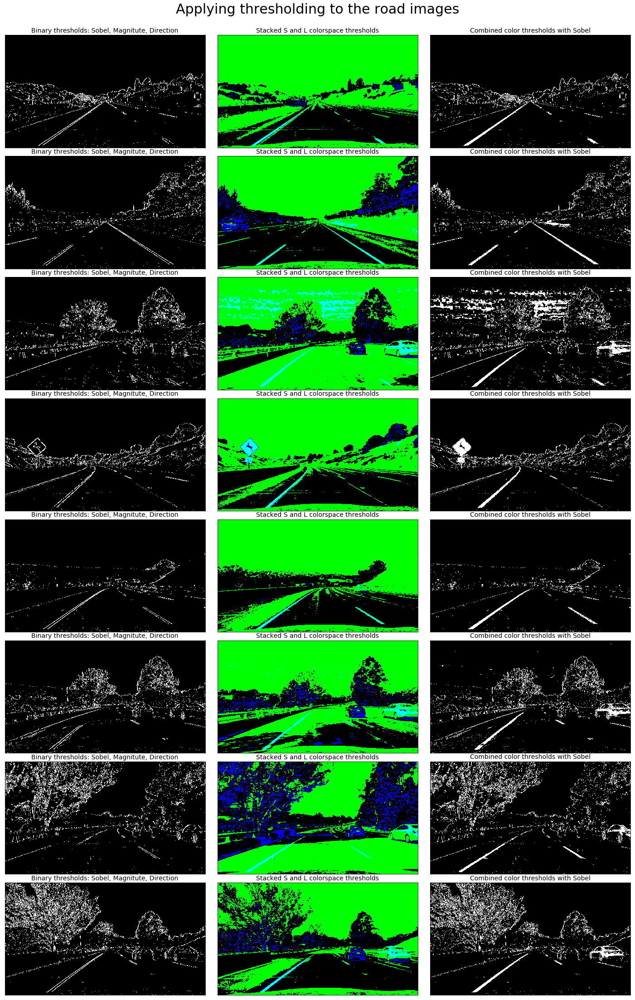

In [15]:
# Plotting Sobel, colorspace and combined thesholds
NUM_COLUMNS = 3
NUM_ROAD_IMG = 3*len(images_road)
NUM_ROWS = math.ceil(NUM_ROAD_IMG / NUM_COLUMNS)
fig = plt.figure(figsize=(20,30))
for idx, fname in enumerate(images_road):
    img = mpimg.imread(fname)
    undist = camera.undistort(img)
    sobel_img = threshold_image(undist)
    color_binary = get_color_binary(undist)
    combined_binary = apply_thresholds(undist)
    ax = fig.add_subplot(NUM_ROWS,NUM_COLUMNS,3*idx+1)
    ax.imshow(sobel_img, interpolation='none', cmap='gray')
    ax.set_title('Binary thresholds: Sobel, Magnitute, Direction',  fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(NUM_ROWS,NUM_COLUMNS,3*idx+2)
    ax.imshow(color_binary, interpolation='none')
    ax.set_title('Stacked S and L colorspace thresholds',  fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(NUM_ROWS,NUM_COLUMNS,3*idx+3)
    ax.imshow(combined_binary, interpolation='none', cmap='gray')
    ax.set_title('Combined color thresholds with Sobel',  fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout(w_pad=-0.3, h_pad=-0.2)
plt.suptitle('Applying thresholding to the road images', y=1.02, fontsize=30)
plt.show()

### <a id='perspective_transform'>2.2. Perspective transform</a>

The next step is to perform perspective transformation, and obtain the so-called "bird's-eye-view" of the road. We identify source and destinations polyhedra for image transformation. We use straight line image `straight_lines1.jpg` to find a polyhedron and transform it to rectangular. Method `vertices_img_pipeline` returns source and destination vertices. Method `region_of_interest` (from the first project) zeros out the pixels that are outside of the road segment.

In [16]:
def vertices_img_pipeline(img):
    """Define source and destination vertices for perspective transform
    """
    w = img.shape[1]
    h = img.shape[0]
    d_w = w/25
    d_h = 95
    bottom_w_offset = 425
    bottom_h_offset = 15
    w_offset = 0
    src_v1 = [w/2 + w_offset - bottom_w_offset, h - bottom_h_offset]
    src_v2 = [w/2 + w_offset - d_w, h/2 + d_h ]
    src_v3 = [w/2 + w_offset + d_w, h/2 + d_h ]
    src_v4 = [w/2 + w_offset + bottom_w_offset, h - bottom_h_offset]
    src_vertices = np.array( [[src_v1, src_v2, src_v3, src_v4]], dtype=np.float32 )
    dst_offset = 110
    dst_v1 = [src_vertices[0,0,0] + dst_offset, 720]
    dst_v2 = [src_vertices[0,0,0] + dst_offset, 0]
    dst_v3 = [src_vertices[0,3,0] - dst_offset, 0]
    dst_v4 = [src_vertices[0,3,0] - dst_offset, 720]
    dst_vertices = np.array( [[dst_v1, dst_v2, dst_v3, dst_v4]], dtype=np.float32 )
    return src_vertices, dst_vertices

def region_of_interest(img):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    src_vertices, _ = vertices_img_pipeline(img)

    src_v1 = src_vertices[0,0]
    src_v2 = src_vertices[0,1]
    src_v3 = src_vertices[0,2]
    src_v4 = src_vertices[0,3]
    mask_w_bottom_offset = 100
    mask_w_top_offset = 5
    mask_h_top_offset = 10
    mask_v1 = [src_v1[0] - mask_w_bottom_offset, src_v1[1]]
    mask_v2 = [src_v2[0] - 5, src_v2[1] - mask_h_top_offset]
    mask_v3 = [src_v3[0] + 30, src_v3[1] - mask_h_top_offset]
    mask_v4 = [src_v4[0] + mask_w_bottom_offset, src_v4[1]]
    vertices_mask = np.array([[mask_v1, mask_v2, mask_v3, mask_v4]], dtype=np.int32)
    
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices_mask, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def change_perspective(img, inv=False):
    src, dst = vertices_img_pipeline(img)
    if not inv:
        M = cv2.getPerspectiveTransform(src, dst)
    else:
        M = cv2.getPerspectiveTransform(dst, src)
    img_size = (img.shape[1], img.shape[0])
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped

def image_pipiline_V_0_2(img):
    undist = camera.undistort(img)
    binary_thresh = apply_thresholds(undist)
    binary_thresh = np.uint8(binary_thresh)
    binary_masked = region_of_interest(binary_thresh)
    warped = change_perspective(binary_masked)
    return warped

Visualization of perspective transform:

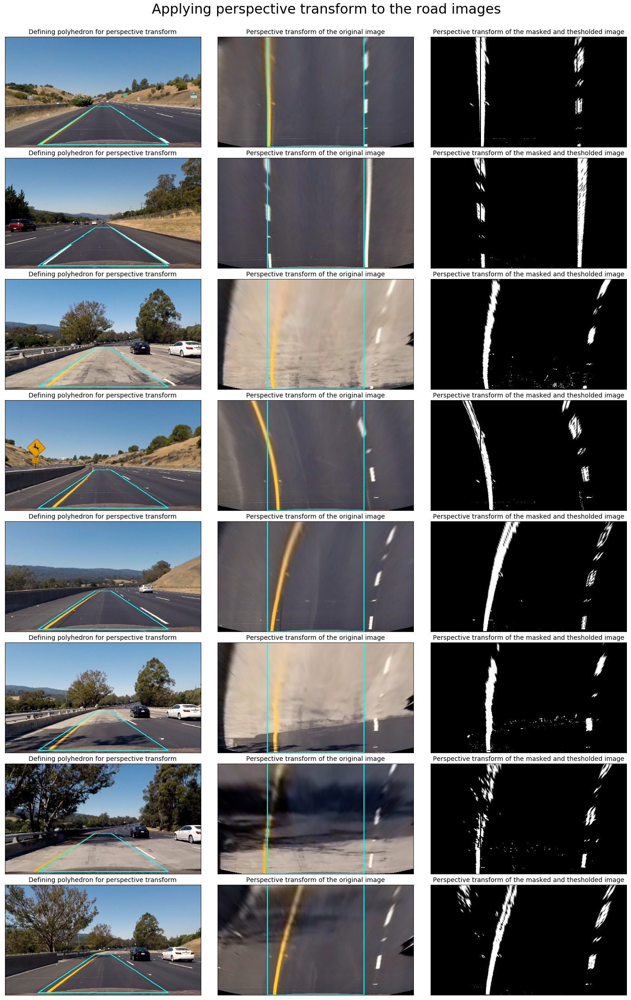

In [17]:
# Plotting original, warped, and masked images
NUM_COLUMNS = 3
NUM_ROAD_IMG = 3*len(images_road)
NUM_ROWS = math.ceil(NUM_ROAD_IMG / NUM_COLUMNS)
fig = plt.figure(figsize=(20,30))
for idx, fname in enumerate(images_road):
    img = mpimg.imread(fname)
    undist = camera.undistort(img)
    src, dst = vertices_img_pipeline(undist)
    combined_binary = apply_thresholds(undist)
    warped_orig = change_perspective(undist)
    warped_mask = region_of_interest(combined_binary)
    warped_mask = change_perspective(warped_mask)
    cv2.polylines(undist,np.int32(src),True,(0,255,255),3)
    cv2.polylines(warped_orig,np.int32(dst),True,(0,255,255),3)
    cv2.polylines(warped_mask,np.int32(dst),True,(0,255,255),4)
    ax = fig.add_subplot(NUM_ROWS,NUM_COLUMNS,3*idx+1)
    ax.imshow(undist, interpolation='none')
    ax.set_title('Defining polyhedron for perspective transform',  fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(NUM_ROWS,NUM_COLUMNS,3*idx+2)
    ax.imshow(warped_orig, interpolation='none')
    ax.set_title('Perspective transform of the original image',  fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(NUM_ROWS,NUM_COLUMNS,3*idx+3)
    ax.imshow(warped_mask, interpolation='none', cmap='gray')
    ax.set_title('Perspective transform of the masked and thesholded image',  fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout(w_pad=-0.3, h_pad=-0.2)
plt.suptitle('Applying perspective transform to the road images', y=1.02, fontsize=30)
plt.show()

### <a id='poly_fit'>2.3 Detecting lane lines and fitting polynomials</a>

Given a bird's-eye-view binary image of the road, we now identify bottom positions of the lines and detect pixels that belong to the lanes. We use `gaussian_filter1d` to smoothen the pixel distributions, and `find_peaks_cwt` to identify maximum probable locations of the lane in an image.

In [18]:
from scipy.ndimage.filters import gaussian_filter1d
from scipy.ndimage.filters import gaussian_filter
from scipy.signal import find_peaks_cwt

def get_lane_peaks(img):
    img_height_half = int(img.shape[0]/2)
    histogram = np.sum(img[img_height_half:,:], axis=0)
    histogram = gaussian_filter1d(histogram, 40)
    peaks = find_peaks_cwt(histogram, np.arange(90,300))
    return histogram, peaks

Visualizing gaussian smoothing and peak detections for a test image:

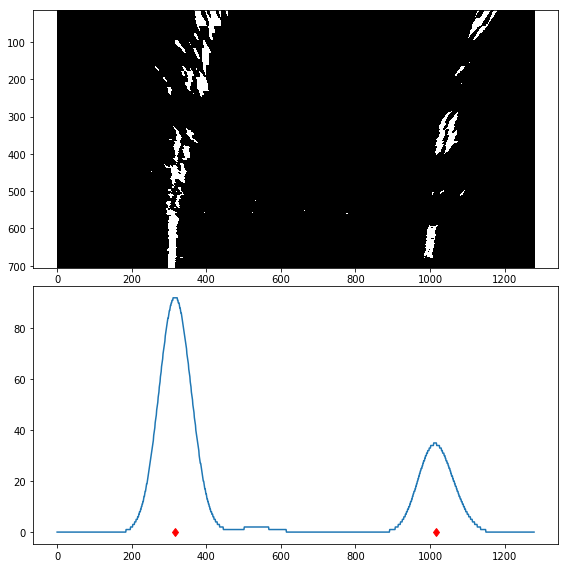

In [19]:
img = mpimg.imread(images_road[6])
bin_img = image_pipiline_V_0_2(img)

histogram, peaks = get_lane_peaks(bin_img)
x= list(range(len(histogram)))
fig = plt.figure(figsize=(8,8))
ax1 = fig.add_subplot(2,1,1)
plt.imshow(gaussian_filter(bin_img, sigma=0.25, order=0), cmap='gray')
fig.add_subplot(2,1,2, sharex=ax1)
plt.plot(x, histogram)
for el in peaks:
    plt.plot(el, 0, 'd', color='red')
plt.tight_layout(w_pad=-0.3, h_pad=-0.2)
plt.show()

We now define a method `get_lane`, which performs initial scanning and detection of the lane lines. When we have initial polynomial coefficients detected, we use `get_successive_poly_fit` to perform search in the region of previously detected polynomial. We then fit second order polynomial to our lane line in a method `get_lane_poly_fit`.

In [47]:
def scan_lane_initial(img, peak, nwindows=9):
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    out_img = np.dstack((img, img, img))*255
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    current_center = peak
    # Create empty lists to receive left and right lane pixel indices
    lane_inds = []
    # Step through the windows one by one
    for window in range(nwindows):
        good_inds, out_img, current_center = get_lane_segment(img, 
                                                              out_img, 
                                                              window, 
                                                              current_center, 
                                                              nonzerox, 
                                                              nonzeroy)
        lane_inds.append(good_inds)
    return out_img, lane_inds

def get_lane_segment(img, out_img, window, current_center, nonzerox, nonzeroy):
    # Set the width of the windows +/- margin
    margin = 140
    # Set minimum number of pixels found to recenter window
    minpix = 50
    nwindows=9
    window_height = np.int(img.shape[0]/nwindows)
    # Identify window boundaries in x and y (and right and left)
    win_y_low  = img.shape[0] - (window+1)*window_height
    win_y_high = img.shape[0] - window*window_height
    win_x_low  = current_center - margin
    win_x_high = current_center + margin
    # Draw the windows on the visualization image
    #cv2.rectangle(out_img,(win_x_low,win_y_low),(win_x_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_x_low) &  (nonzerox < win_x_high)).nonzero()[0]
    # Append these indices to the lists
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_inds) > minpix:
        current_center = np.int(np.mean(nonzerox[good_inds]))
    return good_inds, out_img, current_center

def get_lane(img, peak_idx):
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    histogram, peaks = get_lane_peaks(img)
    out_img, lane_inds = scan_lane_initial(img, peaks[peak_idx])
    lane = np.concatenate(lane_inds)
    lane_indices = nonzeroy[lane], nonzerox[lane]
    return out_img, lane_indices

def get_left_lane(img):
    return get_lane(img, 0)

def get_right_lane(img):
    return get_lane(img, 1)

def get_lane_poly_fit(img, peak_idx):
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    histogram, peaks = get_lane_peaks(img)
    _, lane_inds = scan_lane_initial(img, peaks[peak_idx])
    lane = np.concatenate(lane_inds)
    x = nonzerox[lane]
    y = nonzeroy[lane]
    poly_fit = np.polyfit(y, x, 2)
    poly_y = np.linspace(0, img.shape[0]-1, img.shape[0] )
    poly_x = poly_fit[0]*poly_y**2 + poly_fit[1]*poly_y + poly_fit[2]
    return poly_fit, poly_y, poly_x

def get_left_lane_poly_fit(img):
    return get_lane_poly_fit(img, 0)

def get_right_lane_poly_fit(img):
    return get_lane_poly_fit(img, 1)

def get_successive_poly_fit(img, poly_fit):
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 130
    lane_inds = ((nonzerox > (poly_fit[0]*(nonzeroy**2) + 
                              poly_fit[1]*nonzeroy + 
                              poly_fit[2] - margin)) & 
                 (nonzerox < (poly_fit[0]*(nonzeroy**2) + 
                              poly_fit[1]*nonzeroy + 
                              poly_fit[2] + margin)))
    x = nonzerox[lane_inds]
    y = nonzeroy[lane_inds] 
    new_poly_fit = np.polyfit(y, x, 2)
    poly_y = np.linspace(0, img.shape[0]-1, img.shape[0] )
    poly_x = new_poly_fit[0]*poly_y**2 + new_poly_fit[1]*poly_y + new_poly_fit[2]
    return new_poly_fit, poly_y, poly_x

We now visualize lane detection: we color pixels of the left lane in red, right lane in blue, and the corresponding fitted polynomial in yellow. 

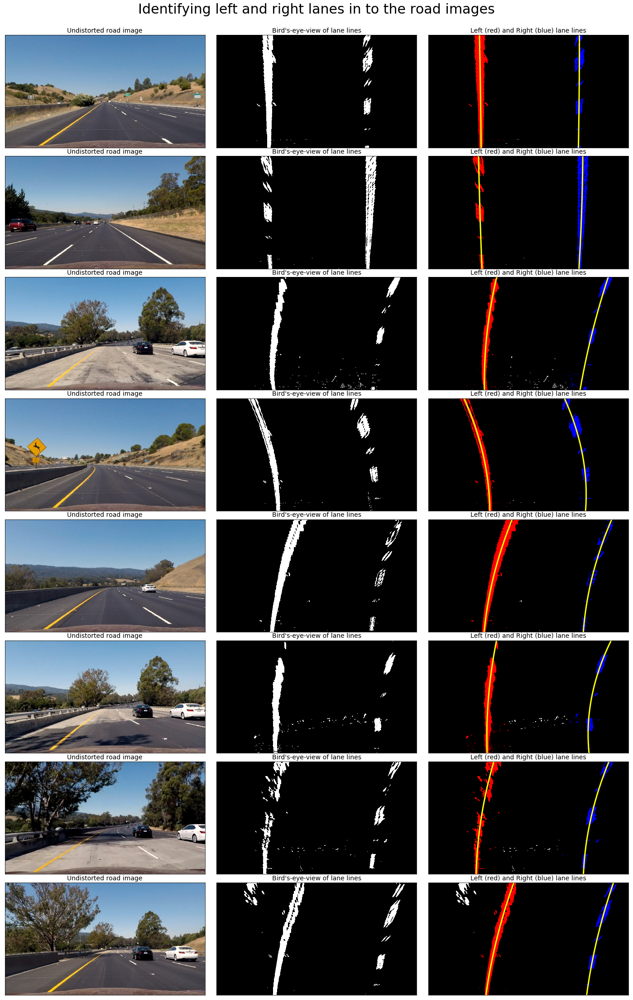

In [28]:
# Plotting undistored, bird's-eye-view, and detected lanes
NUM_COLUMNS = 3
NUM_ROAD_IMG = 3*len(images_road)
NUM_ROWS = math.ceil(NUM_ROAD_IMG / NUM_COLUMNS)
fig = plt.figure(figsize=(20,30))
for idx, fname in enumerate(images_road):
    img = mpimg.imread(fname)
    undist = camera.undistort(img)
    bin_img = image_pipiline_V_0_2(undist)
    out_img, right_lane_indices = get_right_lane(bin_img)
    out_img[right_lane_indices] = [0, 0, 255]
    _, left_lane_indices = get_left_lane(bin_img)
    out_img[left_lane_indices] = [255, 0, 0]
    left_poly_fit, left_poly_y, left_poly_x = get_left_lane_poly_fit(bin_img)
    right_poly_fit, right_poly_y, right_poly_x = get_right_lane_poly_fit(bin_img)
    ax = fig.add_subplot(NUM_ROWS,NUM_COLUMNS,3*idx+1)
    ax.imshow(undist, interpolation='none')
    ax.set_title('Undistorted road image',  fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(NUM_ROWS,NUM_COLUMNS,3*idx+2)
    ax.imshow(bin_img, interpolation='none', cmap='gray')
    ax.set_title('Bird\'s-eye-view of lane lines',  fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(NUM_ROWS,NUM_COLUMNS,3*idx+3)
    ax.imshow(out_img, interpolation='none', cmap='gray')
    plt.plot(left_poly_x, left_poly_y, color='yellow', lw=3)
    plt.plot(right_poly_x, right_poly_y, color='yellow', lw=3)
    ax.set_title('Left (red) and Right (blue) lane lines',  fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout(w_pad=-0.3, h_pad=-0.2)
plt.suptitle('Identifying left and right lanes in to the road images', y=1.02, fontsize=30)
plt.show()

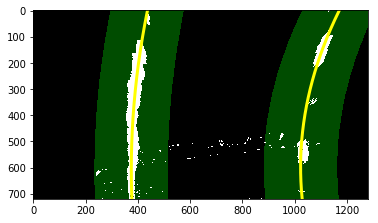

In [34]:
img = mpimg.imread(images_road[5])
undist = camera.undistort(img)
bin_img = image_pipiline_V_0_2(undist)
margin = 140
left_poly_fit, left_poly_y, left_poly_x = get_left_lane_poly_fit(bin_img)
new_left_poly_fit, new_left_poly_y, new_left_poly_x = get_successive_poly_fit(bin_img, left_poly_fit)
left_line_window1 = np.array([np.transpose(np.vstack([left_poly_x-margin, left_poly_y]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_poly_x+margin, 
                              left_poly_y])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
window_img = np.zeros_like(out_img)
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
#right lane
right_poly_fit, right_poly_y, right_poly_x = get_right_lane_poly_fit(bin_img)

new_right_poly_fit, new_right_poly_y, new_right_poly_x = get_successive_poly_fit(bin_img, right_poly_fit)
right_line_window1 = np.array([np.transpose(np.vstack([right_poly_x-margin, right_poly_y]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_poly_x+margin, 
                               right_poly_y])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
stacked_bin = np.dstack((bin_img, bin_img, bin_img))*255
result = cv2.addWeighted(stacked_bin, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(new_left_poly_x, new_left_poly_y, color='yellow', lw=3)
plt.plot(new_right_poly_x, new_right_poly_y, color='yellow', lw=3)
plt.show()

### <a id='curvature'>2.4 Measuring Curvature and vehicle offset</a>

Given polynomial fits for each line, we detect radius of curvature (`radius_of_curvature`) and lane offset (`get_lane_offset`).

In [35]:
def radius_of_curvature(poly_y, poly_x, ym_per_pix=30/720, xm_per_pix=3.7/700):
    y_eval = np.max(poly_y)
    fit_cr = np.polyfit(poly_y*ym_per_pix, poly_x*xm_per_pix, 2)
    curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) /  \
                    np.absolute(2*fit_cr[0])
    return curverad

left_rad = radius_of_curvature(left_poly_y, left_poly_x)
right_rad = radius_of_curvature(right_poly_y, right_poly_x)

print(left_rad, 'm', right_rad, 'm')
# Now our radius of curvature is in meters


1010.54050666 m 398.626481077 m


In [36]:
def get_lane_offset(poly_fit, poly_y):
    mid_point = 640
    xm_per_pix=3.7/690
    y_eval = max(poly_y)
    line_x = poly_fit[0]*y_eval**2 \
           + poly_fit[1]*y_eval \
           + poly_fit[2]
    offset_from_center = (line_x - mid_point)*xm_per_pix
    return offset_from_center

left_offset = get_lane_offset(left_poly_fit, left_poly_y)
right_offset = get_lane_offset(right_poly_fit, right_poly_y)
print(left_offset)
print(right_offset)
offset_from_center = left_offset + right_offset
if offset_from_center >= 0:
    print("Vehicle is {:.2f} m right of center".format(offset_from_center))
else:
    print("Vehicle is {:.2f} m left  of center".format(offset_from_center))

-1.41412275167
2.08203433968
Vehicle is 0.67 m right of center


We now fill the region between the two detected line and project the results back on the original image:

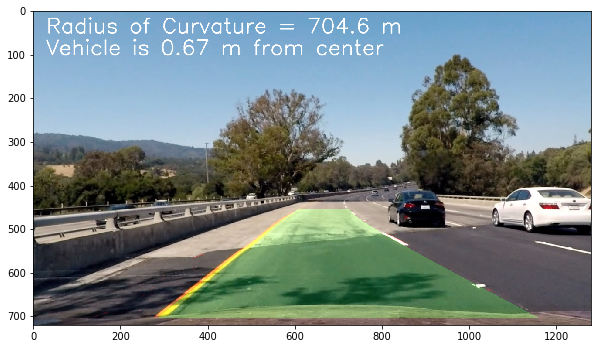

In [37]:
#Visualizing final result
def visualize_final(img):
    warp_zero = np.zeros_like(img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    _, right_lane_indices = get_right_lane(img)
    _, left_lane_indices = get_left_lane(img)
    color_warp[right_lane_indices] = [255, 0, 0]
    color_warp[left_lane_indices] = [255, 0, 0]
    left_poly_fit, left_poly_y, left_poly_x = get_left_lane_poly_fit(img)
    right_poly_fit, right_poly_y, right_poly_x = get_right_lane_poly_fit(img)
    pts_left = np.array([np.transpose(np.vstack([left_poly_x, left_poly_y]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_poly_x, right_poly_y])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    # color_warp[right_lane_indices] = [255,0, 0]
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    new_warp = change_perspective(color_warp, inv=True)
    return new_warp

newwarp = visualize_final(bin_img)
result = cv2.addWeighted(undist, 1, newwarp, 0.2, 0)

font = cv2.FONT_HERSHEY_SIMPLEX
msg_rad = "Radius of Curvature = {:.1f} m".format( (left_rad + right_rad)/2 )
msg_off = "Vehicle is {:.2f} m from center".format( offset_from_center )
cv2.putText(result, msg_rad, (30,50),  font, 1.6,(255,255,255),2,cv2.LINE_AA)
cv2.putText(result, msg_off, (30,100), font, 1.6,(255,255,255),2,cv2.LINE_AA)
fig = plt.figure(figsize=(10,10))
plt.imshow(result)
plt.show()


### <a id='image_pipeline'>2.5 Putting all the steps together</a>

The method below takes original image and performs all the steps of the image pipeline:
1. Undistort an image
2. Apply thresholds (colorspace and Sobel)
3. Zero out pixels that are outside of the predefined mask of the road
4. Change perspective
5. Detect right and left lanes
6. Fit polynomials for right and left lanes
7. Calculate curvature an offset
8. Project result on undistored image
9. Put the text messages

In [53]:
def pipeline_v_0_3(img):
    undist = camera.undistort(img)
    binary_thresh = np.uint8(apply_thresholds(undist))
    binary_masked = region_of_interest(binary_thresh)
    bin_img = change_perspective(binary_masked)
    out_img, right_lane_indices = get_right_lane(bin_img)
    out_img[right_lane_indices] = [0, 0, 255]
    _, left_lane_indices = get_left_lane(bin_img)
    out_img[left_lane_indices] = [255, 0, 0]
    left_poly_fit, left_poly_y, left_poly_x = get_left_lane_poly_fit(bin_img)
    right_poly_fit, right_poly_y, right_poly_x = get_right_lane_poly_fit(bin_img)
    left_rad = radius_of_curvature(left_poly_y, left_poly_x)
    right_rad = radius_of_curvature(right_poly_y, right_poly_x)
    left_offset = get_lane_offset(left_poly_fit, left_poly_y)
    right_offset = get_lane_offset(right_poly_fit, right_poly_y)
    offset_from_center = left_offset + right_offset
    newwarp = visualize_final(bin_img)   
    result = cv2.addWeighted(undist, 1, newwarp, 0.2, 0)
    font = cv2.FONT_HERSHEY_SIMPLEX
    msg_rad = "Radius of Curvature = {:.1f} m".format( (left_rad + right_rad)/2 )
    msg_off = "Vehicle is {:.2f} m from center".format( offset_from_center )
    cv2.putText(result, msg_rad, (30,50),  font, 1.6,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(result, msg_off, (30,100), font, 1.6,(255,255,255),2,cv2.LINE_AA)
    return result

### <a id='image_result'>2.6 Visualizing results of image pipeline</a>

We now apply the image pipeline to all the images from the `test_images` folder and display the output.

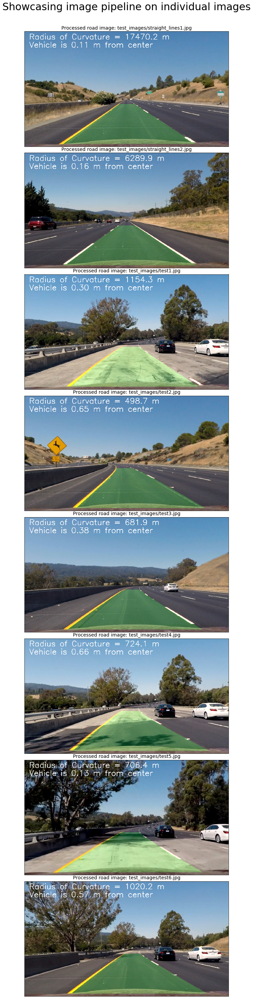

In [59]:
# Plotting undistored, bird's-eye-view, and detected lanes
NUM_COLUMNS = 1
NUM_ROAD_IMG = len(images_road)
NUM_ROWS = math.ceil(NUM_ROAD_IMG / NUM_COLUMNS)
fig = plt.figure(figsize=(10,40))
for idx, fname in enumerate(images_road):
    img = mpimg.imread(fname)
    result = pipeline_v_0_3(img)
    ax = fig.add_subplot(NUM_ROWS,NUM_COLUMNS,idx+1)
    ax.imshow(result)
    ax.set_title('Processed road image: {}'.format(fname),  fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout(w_pad=-0.3, h_pad=-0.2)
plt.suptitle('Showcasing image pipeline on individual images', y=1.02, fontsize=30)
plt.show()

## <a id='oop'>3. Object oriented design</a>

In order to correctly process video stream, and get our design extensible for future, we define three classes: `Line`, `ImageHandler` and `VideoHandler`. The `Line` class holds polynomial coefficients, radius of curvature and vehicle offset. `ImageHandler` class holds all the methods from image processing pipeline, and accepts a color image from `VideoHandler`, which in turn applies `ImageHandler.process_image` method for each frame of the video clip.

In [61]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from collections import deque

In [62]:
class Line():
    def __init__(self):
        self.N_WINDOW = 13
        self.poly_fit  = deque([], self.N_WINDOW)
        self.poly_y    = deque([], self.N_WINDOW)
        self.poly_x    = deque([], self.N_WINDOW)
        self.curvature = deque([], self.N_WINDOW)
        self.offset    = deque([], self.N_WINDOW)
    
    #write method to 1) 
    def set_current_poly_fit(self, poly_fit, poly_y, poly_x):
        self.poly_fit.append(poly_fit)
        self.poly_y.append(poly_y)
        self.poly_x.append(poly_x)

    def set_current_curvature(self, rad):
        self.curvature.append(rad)
        
    def set_current_offset(self, offset):
        self.offset.append(offset)
        
    def get_curvature(self):
        return sum(self.curvature)/self.N_WINDOW
    
    def get_offset(self):
        return sum(self.offset)/self.N_WINDOW

In [63]:
class ImageHandler():
    def __init__(self, *args, **kwargs):
        self.left_line = Line()  
        self.right_line = Line()
        self.camera = Camera()
    
    def process_image(self, img):
        undist = self.camera.undistort(img)
        binary_thresh = np.uint8(self.apply_thresholds(undist))
        binary_masked = self.region_of_interest(binary_thresh)
        bin_img = self.change_perspective(binary_masked)
        out_img, right_lane_indices = self.get_right_lane(bin_img)
        out_img[right_lane_indices] = [0, 0, 255]
        _, left_lane_indices = self.get_left_lane(bin_img)
        out_img[left_lane_indices] = [255, 0, 0]
        left_poly_fit, left_poly_y, left_poly_x = self.get_left_lane_poly_fit(bin_img)
        right_poly_fit, right_poly_y, right_poly_x = self.get_right_lane_poly_fit(bin_img)
        left_rad = self.radius_of_curvature(left_poly_y, left_poly_x)
        right_rad = self.radius_of_curvature(right_poly_y, right_poly_x)
        left_offset = self.get_lane_offset(left_poly_fit, left_poly_y)
        right_offset = self.get_lane_offset(right_poly_fit, right_poly_y)
        self.left_line.set_current_poly_fit(left_poly_fit, left_poly_y, left_poly_x)
        self.right_line.set_current_poly_fit(right_poly_fit, right_poly_y, right_poly_x)
        self.left_line.set_current_curvature(left_rad)
        self.right_line.set_current_curvature(right_rad)
        self.left_line.set_current_offset(left_offset)
        self.right_line.set_current_offset(right_offset)
        avg_left_offset = self.left_line.get_offset()
        avg_right_offset = self.right_line.get_offset()
        avg_left_rad = self.left_line.get_curvature()
        avg_right_rad = self.right_line.get_curvature()
        offset_from_center = avg_left_offset + avg_right_offset
        newwarp = self.visualize_final(bin_img)   
        result = cv2.addWeighted(undist, 1, newwarp, 0.2, 0)
        font = cv2.FONT_HERSHEY_SIMPLEX
        msg_rad = "Radius of Curvature = {:.1f} m".format( (avg_left_rad + avg_right_rad)/2 )
        msg_off = "Vehicle is {:.2f} m from center".format( offset_from_center )
        cv2.putText(result, msg_rad, (30,50),  font, 1.6,(255,255,255),2,cv2.LINE_AA)
        cv2.putText(result, msg_off, (30,100), font, 1.6,(255,255,255),2,cv2.LINE_AA)
        return result
    
    def abs_sobel_thresh(self, image, orient='x', sobel_kernel=3, thresh=(0, 255)):
        # Calculate directional gradient: x or y 
        # Apply threshold
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        # Apply x or y gradient with the OpenCV Sobel() function
        # and take the absolute value
        if orient == 'x':
            abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
        if orient == 'y':
            abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
        # Rescale back to 8 bit integer
        scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
        # Create a copy and apply the threshold
        grad_binary = np.zeros_like(scaled_sobel)
        grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
        return grad_binary
    
    def mag_thresh(self, image, sobel_kernel=3, mag_thresh=(0, 255)):
        # Calculate gradient magnitude (l2-norm)
        # Convert to grayscale
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        # Take both Sobel x and y gradients
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        # Calculate the gradient magnitude
        gradmag = np.sqrt(sobelx**2 + sobely**2)
        # Rescale to 8 bit
        scale_factor = np.max(gradmag)/255 
        gradmag = (gradmag/scale_factor).astype(np.uint8) 
        # Create a binary image of ones where threshold is met, zeros otherwise
        mag_binary = np.zeros_like(gradmag)
        mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
        return mag_binary
    
    def dir_threshold(self, image, sobel_kernel=3, thresh=(0, np.pi/2)):
        # Calculate gradient direction -- arctan(y/x)
        # Apply threshold
        # 1) Convert to grayscale
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        # 2) Take the gradient in x and y separately
        sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
        sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
        # 3) Take the absolute value of the x and y gradients
        abs_sobel_x = np.absolute(sobel_x)
        abs_sobel_y = np.absolute(sobel_y)
        # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
        grad_dir = np.arctan2(abs_sobel_y, abs_sobel_x)
        # 5) Create a binary mask where direction thresholds are met
        dir_binary = np.zeros_like(grad_dir)
        # 6) Return this mask as your binary_output image
        dir_binary[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
        return dir_binary
    
    def threshold_image(self, image, x_kernel=3, x_thresh=(30, 110), y_kernel=3, y_thresh=(40,110),
                               m_kernel=3, m_thresh=(30, 80),  d_kernel=7, d_thresh=(0.8,1.3)):
        gradx = self.abs_sobel_thresh(image, orient='x', sobel_kernel=x_kernel, thresh=x_thresh)
        grady = self.abs_sobel_thresh(image, orient='y', sobel_kernel=y_kernel, thresh=y_thresh)
        mag_binary = self.mag_thresh(image, sobel_kernel=m_kernel, mag_thresh=m_thresh)
        dir_binary = self.dir_threshold(image, sobel_kernel=d_kernel, thresh=d_thresh)
        
        combined = np.zeros_like(dir_binary)
        #combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
        combined[((gradx == 1)) | ((mag_binary == 1)) & (dir_binary == 1)] = 1
    
        return combined
    
    def hls_threshold(self, img, s_thresh=(130, 255), l_thresh=(90,255)):
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        l_channel = hls[:,:,1]
        s_channel = hls[:,:,2]
        s_binary = np.zeros_like(s_channel)
        s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
        l_binary = np.zeros_like(l_channel)
        l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
        return s_binary, l_binary
    
    def apply_thresholds(self, img):
        s_binary, l_binary = self.hls_threshold(img)
        out_img = self.threshold_image(img)
        combined_binary = np.zeros_like(out_img)
        combined_binary[ (l_binary == 1) & (s_binary == 1) | (out_img == 1)] = 1
        return combined_binary
    
    def get_color_binary(self, img):
        s_binary, l_binary = self.hls_threshold(img)
        # Stack each channel to view their individual contributions in green and blue respectively
        # This returns a stack of the two binary images, whose components you can see as different colors
        color_binary = np.uint8(np.dstack(( np.zeros_like(s_binary), l_binary, s_binary)) * 255)
        return color_binary
    
    def vertices_img_pipeline(self, img):
        """Define source and destination vertices for perspective transform
        """
        w = img.shape[1]
        h = img.shape[0]
        d_w = w/25
        d_h = 95
        bottom_w_offset = 425
        bottom_h_offset = 15
        w_offset = 0
        src_v1 = [w/2 + w_offset - bottom_w_offset, h - bottom_h_offset]
        src_v2 = [w/2 + w_offset - d_w, h/2 + d_h ]
        src_v3 = [w/2 + w_offset + d_w, h/2 + d_h ]
        src_v4 = [w/2 + w_offset + bottom_w_offset, h - bottom_h_offset]
        src_vertices = np.array( [[src_v1, src_v2, src_v3, src_v4]], dtype=np.float32 )
        dst_offset = 110
        dst_v1 = [src_vertices[0,0,0] + dst_offset, 720]
        dst_v2 = [src_vertices[0,0,0] + dst_offset, 0]
        dst_v3 = [src_vertices[0,3,0] - dst_offset, 0]
        dst_v4 = [src_vertices[0,3,0] - dst_offset, 720]
        dst_vertices = np.array( [[dst_v1, dst_v2, dst_v3, dst_v4]], dtype=np.float32 )
        return src_vertices, dst_vertices
    
    def region_of_interest(self, img):
        """
        Applies an image mask.
        
        Only keeps the region of the image defined by the polygon
        formed from `vertices`. The rest of the image is set to black.
        """
        src_vertices, _ = self.vertices_img_pipeline(img)
    
        src_v1 = src_vertices[0,0]
        src_v2 = src_vertices[0,1]
        src_v3 = src_vertices[0,2]
        src_v4 = src_vertices[0,3]
        mask_w_bottom_offset = 100
        mask_w_top_offset = 5
        mask_h_top_offset = 10
        mask_v1 = [src_v1[0] - mask_w_bottom_offset, src_v1[1]]
        mask_v2 = [src_v2[0] - 5, src_v2[1] - mask_h_top_offset]
        mask_v3 = [src_v3[0] + 30, src_v3[1] - mask_h_top_offset]
        mask_v4 = [src_v4[0] + mask_w_bottom_offset, src_v4[1]]
        vertices_mask = np.array([[mask_v1, mask_v2, mask_v3, mask_v4]], dtype=np.int32)
        
        #defining a blank mask to start with
        mask = np.zeros_like(img)   
        
        #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
        if len(img.shape) > 2:
            channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
            ignore_mask_color = (255,) * channel_count
        else:
            ignore_mask_color = 255
            
        #filling pixels inside the polygon defined by "vertices" with the fill color    
        cv2.fillPoly(mask, vertices_mask, ignore_mask_color)
        
        #returning the image only where mask pixels are nonzero
        masked_image = cv2.bitwise_and(img, mask)
        return masked_image
    
    def change_perspective(self, img, inv=False):
        src, dst = self.vertices_img_pipeline(img)
        if not inv:
            M = cv2.getPerspectiveTransform(src, dst)
        else:
            M = cv2.getPerspectiveTransform(dst, src)
        img_size = (img.shape[1], img.shape[0])
        warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
        return warped
    
    def get_lane_peaks(self, img):
        img_height_half = int(img.shape[0]/2)
        histogram = np.sum(img[img_height_half:,:], axis=0)
        histogram = gaussian_filter1d(histogram, 40)
        peaks = find_peaks_cwt(histogram, np.arange(90,300))
        return histogram, peaks
    
    def scan_lane_initial(self, img, peak, nwindows=9):
        # Set height of windows
        window_height = np.int(img.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        out_img = np.dstack((img, img, img))*255
        nonzero = img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        current_center = peak
        # Create empty lists to receive left and right lane pixel indices
        lane_inds = []
        # Step through the windows one by one
        for window in range(nwindows):
            good_inds, out_img, current_center = self.get_lane_segment(img, 
                                                                  out_img, 
                                                                  window, 
                                                                  current_center, 
                                                                  nonzerox, 
                                                                  nonzeroy)
            lane_inds.append(good_inds)
        return out_img, lane_inds
    
    def get_lane_segment(self, img, out_img, window, current_center, nonzerox, nonzeroy):
        # Set the width of the windows +/- margin
        margin = 140
        # Set minimum number of pixels found to recenter window
        minpix = 50
        nwindows=9
        window_height = np.int(img.shape[0]/nwindows)
        # Identify window boundaries in x and y (and right and left)
        win_y_low  = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_x_low  = current_center - margin
        win_x_high = current_center + margin
        # Draw the windows on the visualization image
        #cv2.rectangle(out_img,(win_x_low,win_y_low),(win_x_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_x_low) &  (nonzerox < win_x_high)).nonzero()[0]
        # Append these indices to the lists
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_inds) > minpix:
            current_center = np.int(np.mean(nonzerox[good_inds]))
        return good_inds, out_img, current_center
    
    def get_lane(self, img, peak_idx):
        nonzero = img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        histogram, peaks = self.get_lane_peaks(img)
        out_img, lane_inds = self.scan_lane_initial(img, peaks[peak_idx])
        lane = np.concatenate(lane_inds)
        lane_indices = nonzeroy[lane], nonzerox[lane]
        return out_img, lane_indices
    
    def get_left_lane(self, img):
        return self.get_lane(img, 0)
    
    def get_right_lane(self, img):
        return self.get_lane(img, 1)
    
    def get_lane_poly_fit(self, img, peak_idx):
        nonzero = img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        histogram, peaks = self.get_lane_peaks(img)
        _, lane_inds = self.scan_lane_initial(img, peaks[peak_idx])
        lane = np.concatenate(lane_inds)
        x = nonzerox[lane]
        y = nonzeroy[lane]
        poly_fit = np.polyfit(y, x, 2)
        poly_y = np.linspace(0, img.shape[0]-1, img.shape[0] )
        poly_x = poly_fit[0]*poly_y**2 + poly_fit[1]*poly_y + poly_fit[2]
        return poly_fit, poly_y, poly_x
    
    def get_left_lane_poly_fit(self, img):
        return self.get_lane_poly_fit(img, 0)
    
    def get_right_lane_poly_fit(self, img):
        return self.get_lane_poly_fit(img, 1)
    
    def get_successive_poly_fit(self, img, poly_fit):
        nonzero = img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 130
        lane_inds = ((nonzerox > (poly_fit[0]*(nonzeroy**2) + 
                                  poly_fit[1]*nonzeroy + 
                                  poly_fit[2] - margin)) & 
                     (nonzerox < (poly_fit[0]*(nonzeroy**2) + 
                                  poly_fit[1]*nonzeroy + 
                                  poly_fit[2] + margin)))
        x = nonzerox[lane_inds]
        y = nonzeroy[lane_inds] 
        new_poly_fit = np.polyfit(y, x, 2)
        poly_y = np.linspace(0, img.shape[0]-1, img.shape[0] )
        poly_x = new_poly_fit[0]*poly_y**2 + new_poly_fit[1]*poly_y + new_poly_fit[2]
        return new_poly_fit, poly_y, poly_x
    
    def radius_of_curvature(self, poly_y, poly_x, ym_per_pix=30/720, xm_per_pix=3.7/700):
        y_eval = np.max(poly_y)
        fit_cr = np.polyfit(poly_y*ym_per_pix, poly_x*xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) /  \
                        np.absolute(2*fit_cr[0])
        return curverad
    
    def get_lane_offset(self, poly_fit, poly_y):
        mid_point = 640
        xm_per_pix=3.7/690
        y_eval = max(poly_y)
        line_x = poly_fit[0]*y_eval**2 \
               + poly_fit[1]*y_eval \
               + poly_fit[2]
        offset_from_center = (line_x - mid_point)*xm_per_pix
        return offset_from_center
    
    def visualize_final(self, img):
        warp_zero = np.zeros_like(img).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
        _, right_lane_indices = self.get_right_lane(img)
        _, left_lane_indices = self.get_left_lane(img)
        color_warp[right_lane_indices] = [255, 0, 0]
        color_warp[left_lane_indices] = [255, 0, 0]
        left_poly_fit, left_poly_y, left_poly_x = self.get_left_lane_poly_fit(img)
        right_poly_fit, right_poly_y, right_poly_x = self.get_right_lane_poly_fit(img)
        pts_left = np.array([np.transpose(np.vstack([left_poly_x, left_poly_y]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_poly_x, right_poly_y])))])
        pts = np.hstack((pts_left, pts_right))
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
        # color_warp[right_lane_indices] = [255,0, 0]
        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        new_warp = self.change_perspective(color_warp, inv=True)
        return new_warp

In [85]:
class VideoHandler():
    
    def __init__(self, *args, **kwargs):
        self.clip_name = args[0]["input_video"]
        self.subclip_length = args[0]["subclip_length"]
        self.out_clip = None
        self.out_clip_name = args[0]["output_video"]
#         self.video_clip = VideoFileClip(self.clip_name).subclip(0, self.subclip_length)
#         self.video_clip = VideoFileClip(self.clip_name).subclip(20, 25)
#         self.video_clip = VideoFileClip(self.clip_name).subclip(23, 25)
#         self.video_clip = VideoFileClip(self.clip_name).subclip(38, 42)
        self.video_clip = VideoFileClip(self.clip_name)
        self.frame_counter = 0
        self.image_handler = ImageHandler()
    
    def process_video(self):
        self.out_clip = self.video_clip.fl_image(self.process_image) #NOTE: this function expects color images!!
        self.out_clip.write_videofile(self.out_clip_name, audio=False)
    
    def process_image(self, img):
        self.frame_counter += 1
        out_img = self.image_handler.process_image(img)
#         print("Processing frame: {} of shape {}".format(self.frame_counter, img.shape))
        return out_img

## <a id='video_pipeline'>4. Video processing pipeline</a>

The method below invoked the video processing pipeline, and creates `project_video_out.mp4` video clip.

In [86]:
from collections import OrderedDict
def process_video_v():
    print("Starting video processing")
    args = OrderedDict()
    args["input_video"] = 'project_video.mp4'
    args["output_video"] = 'project_video_out.mp4'
    args["subclip_length"] = 9
    video_handler = VideoHandler(args)
    print("video_handler: input  {}".format(video_handler.clip_name))
    print("video_handler: output {}".format(video_handler.out_clip_name))
    video_handler.process_video()

process_video_v()

Starting video processing
video_handler: input  project_video.mp4
video_handler: output project_video_out.mp4
[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4



 12%|█▏        | 152/1261 [03:03<21:40,  1.17s/it]


 24%|██▍       | 303/1261 [06:01<18:42,  1.17s/it]


 36%|███▌      | 454/1261 [09:02<15:45,  1.17s/it]


 48%|████▊     | 605/1261 [11:56<12:25,  1.14s/it]


 60%|█████▉    | 756/1261 [14:53<09:30,  1.13s/it]


 72%|███████▏  | 907/1261 [17:54<07:16,  1.23s/it]


 84%|████████▍ | 1057/1261 [20:58<03:58,  1.17s/it]


 96%|█████████▌| 1205/1261 [23:55<01:03,  1.14s/it]


100%|█████████▉| 1260/1261 [25:00<00:01,  1.25s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

